In [2]:
import librosa 
import librosa.display
import IPython.display as ipd
import os 
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import Audio
import tensorflow.keras as keras
import tensorflow as tf



In [3]:
paths = []
labels = []
for dirname , _ , filenames in os.walk(r"C:\Users\Dell_i7\Desktop\project_data"):
    for filename in filenames :
        paths.append(os.path.join(dirname, filename))
        label = filename.split('_')[-1]
        label = label.split('.')[0]
        labels.append(label.lower())

In [4]:
#create a data frame
df = pd.DataFrame()
df['audio'] = paths
df['label'] = labels
df

,audio,label
0,C:\Users\Dell_i7\Desktop\project_data\10_ahlam...,ahlam
1,C:\Users\Dell_i7\Desktop\project_data\10_ahmad...,ahmad
2,C:\Users\Dell_i7\Desktop\project_data\10_ahmad...,ahmadsa
3,C:\Users\Dell_i7\Desktop\project_data\10_anwar...,anwar
4,C:\Users\Dell_i7\Desktop\project_data\10_areej...,areej
...,...,...
325,C:\Users\Dell_i7\Desktop\project_data\9_walaa.wav,walaa
326,C:\Users\Dell_i7\Desktop\project_data\9_yasser...,yasser
327,C:\Users\Dell_i7\Desktop\project_data\9_yazan.wav,yazan
328,C:\Users\Dell_i7\Desktop\project_data\9_zaid.wav,zaid


In [5]:
df['label'].value_counts()

label
ahlam       10
noor        10
zaid        10
yazan       10
yasser      10
walaa       10
tuqa        10
shatha      10
shahd       10
samia       10
sadeen      10
rofida      10
rama        10
qusai       10
obada       10
nusaibah    10
nagham      10
ahmad       10
mohammad    10
maryam      10
maram       10
lojain      10
laith       10
khalil      10
khaled      10
esraa       10
doha        10
dania       10
ayman       10
areej       10
anwar       10
ahmadsa     10
zakaria     10
Name: count, dtype: int64

In [6]:
def waveplot (data, sr, label):
    plt.figure(figsize=(10,4))
    plt.title(label, size=20)
    librosa.display.waveshow(data, sr=sr)
    plt.show()

In [7]:
def spectogram(data, sr, label):
    x = librosa.stft(data)
    xdb = librosa.amplitude_to_db(abs(x))
    plt.figure(figsize=(11,4))
    plt.title(label, size=20)
    librosa.display.specshow(xdb, sr=sr, x_axis= 'time', y_axis='hz')
    plt.colorbar()

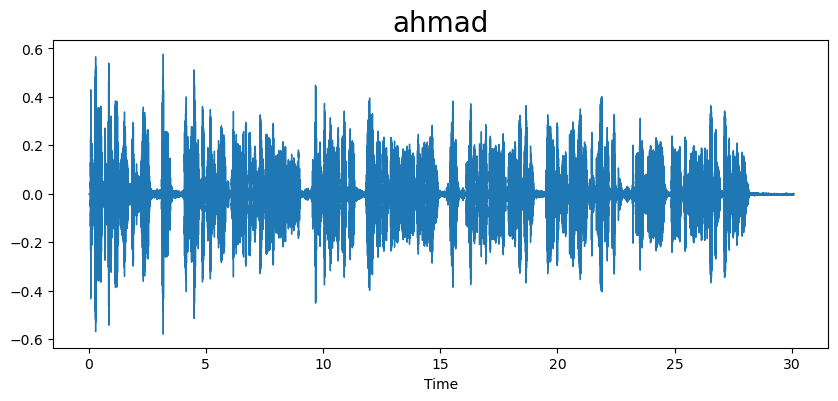

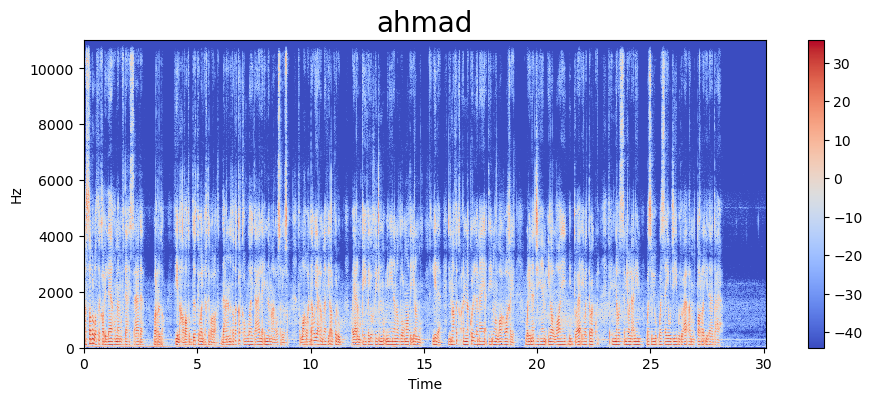

In [8]:
label = 'ahmad'
path = np.array(df['audio'][df['label']==label])[4]
data, sampling_rate = librosa.load(path)
waveplot(data, sampling_rate, label)
spectogram(data, sampling_rate, label)
Audio(path)

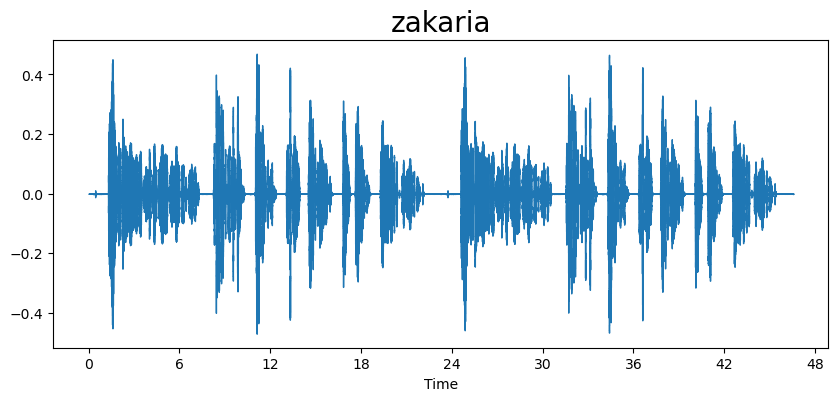

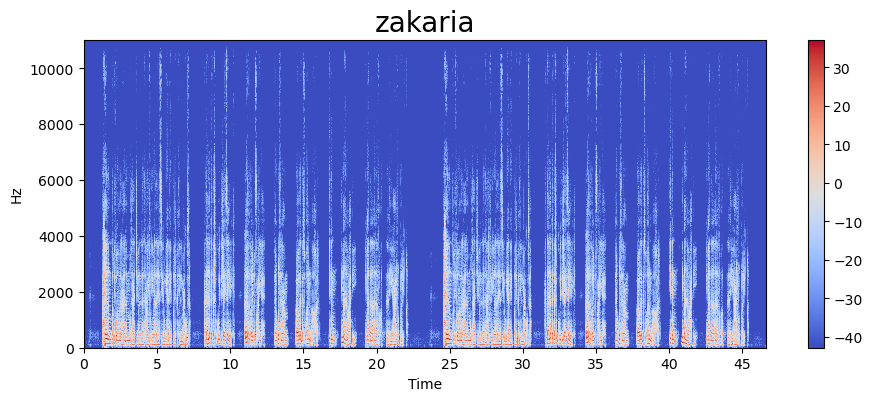

In [9]:
label = 'zakaria'
path = np.array(df['audio'][df['label']==label])[8]
data, sampling_rate = librosa.load(path)
waveplot(data, sampling_rate, label)
spectogram(data, sampling_rate, label)
Audio(path)

In [10]:
def extract_features(filename):
    y, sr = librosa.load(filename, duration=3, offset=0.2)
    mfcc = np.mean(librosa.feature.mfcc(y=y, sr=sr, n_mfcc=40).T, axis=0)
    chroma = np.mean(librosa.feature.chroma_stft(y=y, sr=sr).T, axis=0)
    spectral_contrast = np.mean(librosa.feature.spectral_contrast(y=y, sr=sr).T, axis=0)
    zero_crossing_rate = np.mean(librosa.feature.zero_crossing_rate(y).T, axis=0)
    return np.hstack([mfcc, chroma, spectral_contrast, zero_crossing_rate])




In [11]:
# Flatten the features for each audio file
x_features = df['audio'].apply(lambda x: extract_features(x))

In [12]:
# Convert x_features to a numpy array
x = np.vstack(x_features)

In [13]:
x

array([[-3.71347076e+02,  1.08657074e+02,  2.30185199e+00, ...,
         2.21557065e+01,  4.71113738e+01,  6.71762320e-02],
       [-2.43971359e+02,  1.14422684e+02, -1.03701019e+01, ...,
         1.87250370e+01,  4.34239281e+01,  8.93554688e-02],
       [-2.95643402e+02,  1.65766388e+02,  6.98059940e+00, ...,
         1.92949270e+01,  4.76243395e+01,  5.19831731e-02],
       ...,
       [-1.70165649e+02,  1.10798721e+02,  2.80157299e+01, ...,
         1.77337764e+01,  4.73191186e+01,  1.02381310e-01],
       [-2.20202347e+02,  1.46660721e+02, -2.85760860e+01, ...,
         2.35727079e+01,  4.96872828e+01,  7.65399639e-02],
       [-3.90523376e+02,  1.28068726e+02,  2.14580784e+01, ...,
         2.31949954e+01,  4.66012885e+01,  7.58112981e-02]])

In [14]:
# Encoding labels
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(df['label'])


In [15]:
y

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32,  0,
        1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32,  0,  1,
        2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18,
       19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32,  0,  1,  2,
        3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19,
       20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32,  0,  1,  2,  3,
        4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20,
       21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32,  0,  1,  2,  3,  4,
        5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21,
       22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32,  0,  1,  2,  3,  4,  5,
        6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
       23, 24, 25, 26, 27

In [16]:
from sklearn.svm import SVC  # for Support Vector Classifier (SVM)
from sklearn.linear_model import LogisticRegression  # for Logistic Regression
from sklearn.ensemble import StackingClassifier
from sklearn.model_selection import StratifiedKFold, cross_val_predict
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_curve, auc, roc_auc_score
from sklearn.preprocessing import label_binarize
# Define base models
svm_model = SVC(kernel='linear', probability=True, random_state=42)
logistic_model = LogisticRegression(random_state=42)

# Create stacked model
stacked_model = StackingClassifier(
    estimators=[('svm', svm_model), ('logistic', logistic_model)],
    final_estimator=LogisticRegression(random_state=42)
)

In [17]:
from sklearn import metrics
num_splits = 5
kfold = StratifiedKFold(num_splits, shuffle=True, random_state=1)
train_acc, test_acc = [], [] #create empty list to store accuracy values
tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)
stacked_predictions = np.zeros((len(y), len(np.unique(y))))
for train_index, test_index, in kfold.split(x,y): #generate indices to split data into trainng and test set.
    x_train, x_test = x[train_index], x[test_index]
    y_train, y_test = y[train_index], y[test_index]

    stacked_model.fit(x_train, y_train)
    y_pred_train = stacked_model.predict(x_train)
    y_pred_test = stacked_model.predict(x_test)

    train_acc.append(metrics.accuracy_score(y_train, y_pred_train)*100)
    test_acc.append(metrics.accuracy_score(y_test, y_pred_test)*100)
    stacked_predictions[test_index] = stacked_model.predict_proba(x_test)
    y_test_bin = label_binarize(y_test, classes=np.arange(len(np.unique(y))))
    y_score = stacked_model.predict_proba(x_test)
    
    for i in range(y_test_bin.shape[1]):
        fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score[:, i])
        tprs.append(np.interp(mean_fpr, fpr, tpr))
        tprs[-1][0] = 0.0
        roc_auc = auc(fpr, tpr)
        aucs.append(roc_auc)


C:\Users\Dell_i7\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Dell_i7\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_i

In [18]:
avg_train_acc = 0
avg_test_acc = 0
print ("\t", "training accuracy", "\t", "testing accuracy")
for i in range (num_splits):
    print (i, "\t", train_acc[i], "\t \t  \t", test_acc[i])

    avg_train_acc+=train_acc[i]/num_splits
    avg_test_acc+=test_acc[i]/num_splits

    

print ("AVG", "\t", avg_train_acc, "\t \t \t ", avg_test_acc)

	 training accuracy 	 testing accuracy
0 	 90.53030303030303 	 	  	 83.33333333333334
1 	 90.53030303030303 	 	  	 83.33333333333334
2 	 92.04545454545455 	 	  	 77.27272727272727
3 	 89.77272727272727 	 	  	 78.78787878787878
4 	 89.39393939393939 	 	  	 83.33333333333334
AVG 	 90.45454545454545 	 	 	  81.21212121212122


In [19]:
# Calculate total accuracy using cross_val_predict for out-of-sample predictions
y_pred_total = cross_val_predict(stacked_model, x, y, cv=kfold)
total_accuracy = accuracy_score(y, y_pred_total) * 100


C:\Users\Dell_i7\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Dell_i7\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_i

In [20]:
print("Total Accuracy: {:.2f}%".format(total_accuracy))

Total Accuracy: 81.21%


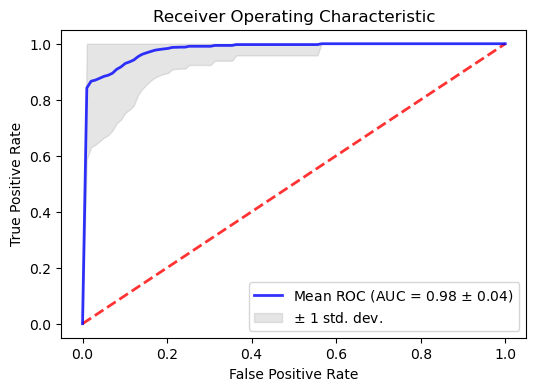

In [21]:
# Plot ROC curve
plt.figure(figsize=(6, 4))
plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b',
         label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),
         lw=2, alpha=.8)
std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,
                 label=r'$\pm$ 1 std. dev.')

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

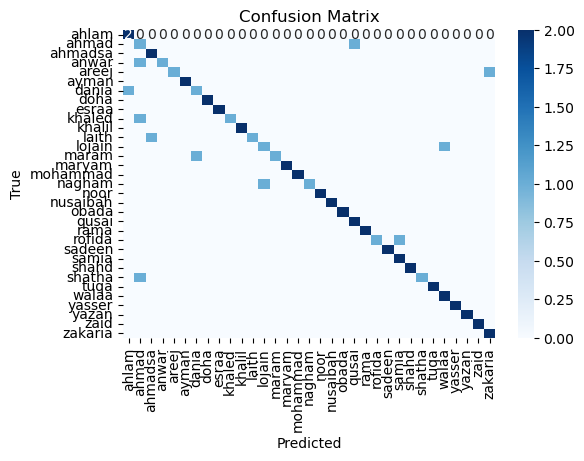

In [26]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred_test)

# Plot confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


In [23]:
from sklearn.metrics import classification_report


report = classification_report(y_test, y_pred_test, target_names=label_encoder.classes_)

# Print classification report
print("Classification Report:\n")
print(report)


Classification Report:

              precision    recall  f1-score   support

       ahlam       0.67      1.00      0.80         2
       ahmad       0.25      0.50      0.33         2
     ahmadsa       0.67      1.00      0.80         2
       anwar       1.00      0.50      0.67         2
       areej       1.00      0.50      0.67         2
       ayman       1.00      1.00      1.00         2
       dania       0.50      0.50      0.50         2
        doha       1.00      1.00      1.00         2
       esraa       1.00      1.00      1.00         2
      khaled       1.00      0.50      0.67         2
      khalil       1.00      1.00      1.00         2
       laith       1.00      0.50      0.67         2
      lojain       0.50      0.50      0.50         2
       maram       1.00      0.50      0.67         2
      maryam       1.00      1.00      1.00         2
    mohammad       1.00      1.00      1.00         2
      nagham       1.00      0.50      0.67         2
   

In [27]:
def predict_audio_label(audio_path, model, label_encoder):
    # Extract features from the audio file
    features = extract_features(audio_path)
    
    # Reshape the features to match the model input
    features = features.reshape(1, -1)
    
    # Predict the label index
    predicted_label_index = model.predict(features)
    
    # Decode the predicted label
    predicted_label = label_encoder.inverse_transform(predicted_label_index)
    
    return predicted_label[0]


In [29]:
audio_path = r"C:\Users\Dell_i7\Desktop\additional\18 May, 6.28 pm_.wav"
predicted_label = predict_audio_label(audio_path, stacked_model, label_encoder)
print(f"The predicted label for the audio file is: {predicted_label}")

The predicted label for the audio file is: tuqa
